In [ ]:
import pandas as pd
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
customers= pd.read_csv("/content/gdrive/MyDrive/Data_Viz/Data viz Sales/Customer.csv")
transactions= pd.read_csv("/content/gdrive/MyDrive/Data_Viz/Data viz Sales/Transactions.csv")
prod_cat= pd.read_csv("/content/gdrive/MyDrive/Data_Viz/Data viz Sales/prod_cat_info.csv")

In [ ]:
import pandas as pd
from datetime import datetime

# convert DOB column to datetime format
customers['DOB'] = pd.to_datetime(customers['DOB'], format='%d-%m-%Y')

# calculate age by subtracting DOB from current date, and converting to years
today = datetime.today()
customers['Age'] = (today - customers['DOB']).astype('<m8[Y]')

In [ ]:
customers

,customer_Id,DOB,Gender,city_code,Age
0,268408,1970-01-02,M,4.0,53.0
1,269696,1970-01-07,F,8.0,53.0
2,268159,1970-01-08,F,8.0,53.0
3,270181,1970-01-10,F,2.0,53.0
4,268073,1970-01-11,M,1.0,53.0
...,...,...,...,...,...
5642,274474,1992-12-19,M,2.0,30.0
5643,267666,1992-12-24,M,6.0,30.0
5644,270476,1992-12-25,F,3.0,30.0
5645,269626,1992-12-27,F,5.0,30.0


In [ ]:
transactions

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,80712190438,270351,28-02-2014,1,1,-5,-772,405.300,-4265.300,e-Shop
1,29258453508,270384,27-02-2014,5,3,-5,-1497,785.925,-8270.925,e-Shop
2,51750724947,273420,24-02-2014,6,5,-2,-791,166.110,-1748.110,TeleShop
3,93274880719,271509,24-02-2014,11,6,-3,-1363,429.345,-4518.345,e-Shop
4,51750724947,273420,23-02-2014,6,5,-2,-791,166.110,-1748.110,TeleShop
...,...,...,...,...,...,...,...,...,...,...
23048,94340757522,274550,25-01-2011,12,5,1,1264,132.720,1396.720,e-Shop
23049,89780862956,270022,25-01-2011,4,1,1,677,71.085,748.085,e-Shop
23050,85115299378,271020,25-01-2011,2,6,4,1052,441.840,4649.840,MBR
23051,72870271171,270911,25-01-2011,11,5,3,1142,359.730,3785.730,TeleShop


In [ ]:
prod_cat

,prod_cat_code,prod_cat,prod_sub_cat_code,prod_subcat
0,1,Clothing,4,Mens
1,1,Clothing,1,Women
2,1,Clothing,3,Kids
3,2,Footwear,1,Mens
4,2,Footwear,3,Women
5,2,Footwear,4,Kids
6,3,Electronics,4,Mobiles
7,3,Electronics,5,Computers
8,3,Electronics,8,Personal Appliances
9,3,Electronics,9,Cameras


In [ ]:
prod_cat['join_key'] = prod_cat['prod_cat_code'].astype(str)+prod_cat['prod_sub_cat_code'].astype(str)
transactions= transactions.rename(columns={'cust_id': 'customer_Id'})
df= pd.merge(customers, transactions, on='customer_Id')

In [ ]:
df

,customer_Id,DOB,Gender,city_code,Age,transaction_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,268408,1970-01-02,M,4.0,53.0,87243835584,13-01-2014,7,5,5,187,98.175,1033.175,TeleShop
1,268408,1970-01-02,M,4.0,53.0,16197868036,16-12-2013,1,4,-5,-210,110.250,-1160.250,Flagship store
2,268408,1970-01-02,M,4.0,53.0,16197868036,12/12/2013,1,4,5,210,110.250,1160.250,Flagship store
3,268408,1970-01-02,M,4.0,53.0,28810141075,2/9/2013,10,6,2,813,170.730,1796.730,TeleShop
4,268408,1970-01-02,M,4.0,53.0,64633435931,6/5/2013,4,2,3,312,98.280,1034.280,Flagship store
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23048,269626,1992-12-27,F,5.0,30.0,71369029396,18-10-2011,12,6,1,638,66.990,704.990,e-Shop
23049,269626,1992-12-27,F,5.0,30.0,94134051896,7/7/2011,3,1,3,1078,339.570,3573.570,MBR
23050,274308,1992-12-29,F,5.0,30.0,26208690928,22-10-2012,1,2,2,898,188.580,1984.580,MBR
23051,274308,1992-12-29,F,5.0,30.0,57358822237,5/9/2012,1,2,4,876,367.920,3871.920,e-Shop


In [ ]:
df['join_key'] = df['prod_cat_code'].astype(str)+df['prod_subcat_code'].astype(str)

In [ ]:
df

,customer_Id,DOB,Gender,city_code,Age,transaction_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type,join_key
0,268408,1970-01-02,M,4.0,53.0,87243835584,13-01-2014,7,5,5,187,98.175,1033.175,TeleShop,57
1,268408,1970-01-02,M,4.0,53.0,16197868036,16-12-2013,1,4,-5,-210,110.250,-1160.250,Flagship store,41
2,268408,1970-01-02,M,4.0,53.0,16197868036,12/12/2013,1,4,5,210,110.250,1160.250,Flagship store,41
3,268408,1970-01-02,M,4.0,53.0,28810141075,2/9/2013,10,6,2,813,170.730,1796.730,TeleShop,610
4,268408,1970-01-02,M,4.0,53.0,64633435931,6/5/2013,4,2,3,312,98.280,1034.280,Flagship store,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23048,269626,1992-12-27,F,5.0,30.0,71369029396,18-10-2011,12,6,1,638,66.990,704.990,e-Shop,612
23049,269626,1992-12-27,F,5.0,30.0,94134051896,7/7/2011,3,1,3,1078,339.570,3573.570,MBR,13
23050,274308,1992-12-29,F,5.0,30.0,26208690928,22-10-2012,1,2,2,898,188.580,1984.580,MBR,21
23051,274308,1992-12-29,F,5.0,30.0,57358822237,5/9/2012,1,2,4,876,367.920,3871.920,e-Shop,21


In [ ]:
df= pd.merge(df, prod_cat, on='join_key')
df

,customer_Id,DOB,Gender,city_code,Age,transaction_id,tran_date,prod_subcat_code,prod_cat_code_x,Qty,Rate,Tax,total_amt,Store_type,join_key,prod_cat_code_y,prod_cat,prod_sub_cat_code,prod_subcat
0,268408,1970-01-02,M,4.0,53.0,87243835584,13-01-2014,7,5,5,187,98.175,1033.175,TeleShop,57,5,Books,7,Fiction
1,275152,1970-01-16,M,4.0,53.0,73109425404,25-03-2011,7,5,2,464,97.440,1025.440,e-Shop,57,5,Books,7,Fiction
2,275034,1970-01-18,F,4.0,53.0,64777271023,23-05-2011,7,5,2,197,41.370,435.370,Flagship store,57,5,Books,7,Fiction
3,270829,1970-01-22,F,8.0,53.0,87174343938,9/12/2013,7,5,4,1141,479.220,5043.220,e-Shop,57,5,Books,7,Fiction
4,267657,1970-01-29,F,7.0,53.0,76242744953,23-05-2013,7,5,4,1020,428.400,4508.400,e-Shop,57,5,Books,7,Fiction
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23048,267812,1992-12-04,F,1.0,30.0,63540378797,10/10/2012,10,5,3,224,70.560,742.560,TeleShop,510,5,Books,10,Non-Fiction
23049,274618,1992-12-09,F,7.0,30.0,71793203305,17-08-2013,10,5,4,691,290.220,3054.220,Flagship store,510,5,Books,10,Non-Fiction
23050,268097,1992-12-15,F,7.0,30.0,91217108818,1/2/2012,10,5,2,411,86.310,908.310,e-Shop,510,5,Books,10,Non-Fiction
23051,268097,1992-12-15,F,7.0,30.0,90114483354,31-01-2011,10,5,-4,-1408,591.360,-6223.360,e-Shop,510,5,Books,10,Non-Fiction


In [ ]:
df['flag'] = df['total_amt'].apply(lambda x: 1 if x > 0 else -1)
df['city_code'].apply(str)
df

,customer_Id,DOB,Gender,city_code,Age,transaction_id,tran_date,prod_subcat_code,prod_cat_code_x,Qty,Rate,Tax,total_amt,Store_type,join_key,prod_cat_code_y,prod_cat,prod_sub_cat_code,prod_subcat,flag
0,268408,1970-01-02,M,4.0,53.0,87243835584,13-01-2014,7,5,5,187,98.175,1033.175,TeleShop,57,5,Books,7,Fiction,1
1,275152,1970-01-16,M,4.0,53.0,73109425404,25-03-2011,7,5,2,464,97.440,1025.440,e-Shop,57,5,Books,7,Fiction,1
2,275034,1970-01-18,F,4.0,53.0,64777271023,23-05-2011,7,5,2,197,41.370,435.370,Flagship store,57,5,Books,7,Fiction,1
3,270829,1970-01-22,F,8.0,53.0,87174343938,9/12/2013,7,5,4,1141,479.220,5043.220,e-Shop,57,5,Books,7,Fiction,1
4,267657,1970-01-29,F,7.0,53.0,76242744953,23-05-2013,7,5,4,1020,428.400,4508.400,e-Shop,57,5,Books,7,Fiction,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23048,267812,1992-12-04,F,1.0,30.0,63540378797,10/10/2012,10,5,3,224,70.560,742.560,TeleShop,510,5,Books,10,Non-Fiction,1
23049,274618,1992-12-09,F,7.0,30.0,71793203305,17-08-2013,10,5,4,691,290.220,3054.220,Flagship store,510,5,Books,10,Non-Fiction,1
23050,268097,1992-12-15,F,7.0,30.0,91217108818,1/2/2012,10,5,2,411,86.310,908.310,e-Shop,510,5,Books,10,Non-Fiction,1
23051,268097,1992-12-15,F,7.0,30.0,90114483354,31-01-2011,10,5,-4,-1408,591.360,-6223.360,e-Shop,510,5,Books,10,Non-Fiction,-1


In [ ]:
df['city_code']=df['city_code'].replace({1.0:'Paris',2.0:'Auvergne-Rhône-Alpes',3.0:'Brittany',4.0:'Corsica',5.0:'Grand Est',6.0:'Normandie',7.0:'Occitanie',8.0:'Pays de la Loire',9.0:'Nouvelle-Aquitaine',10.0:'Créteil'})
df['AOV'] = df['total_amt']/df['Qty']

In [ ]:
new_data = df.dropna(axis = 0, how ='any') 
new_data.drop(columns='join_key')
new_data

,customer_Id,DOB,Gender,city_code,Age,transaction_id,tran_date,prod_subcat_code,prod_cat_code_x,Qty,...,Tax,total_amt,Store_type,join_key,prod_cat_code_y,prod_cat,prod_sub_cat_code,prod_subcat,flag,AOV
0,268408,1970-01-02,M,Corsica,53.0,87243835584,13-01-2014,7,5,5,...,98.175,1033.175,TeleShop,57,5,Books,7,Fiction,1,206.635
1,275152,1970-01-16,M,Corsica,53.0,73109425404,25-03-2011,7,5,2,...,97.440,1025.440,e-Shop,57,5,Books,7,Fiction,1,512.720
2,275034,1970-01-18,F,Corsica,53.0,64777271023,23-05-2011,7,5,2,...,41.370,435.370,Flagship store,57,5,Books,7,Fiction,1,217.685
3,270829,1970-01-22,F,Pays de la Loire,53.0,87174343938,9/12/2013,7,5,4,...,479.220,5043.220,e-Shop,57,5,Books,7,Fiction,1,1260.805
4,267657,1970-01-29,F,Occitanie,53.0,76242744953,23-05-2013,7,5,4,...,428.400,4508.400,e-Shop,57,5,Books,7,Fiction,1,1127.100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23048,267812,1992-12-04,F,Paris,30.0,63540378797,10/10/2012,10,5,3,...,70.560,742.560,TeleShop,510,5,Books,10,Non-Fiction,1,247.520
23049,274618,1992-12-09,F,Occitanie,30.0,71793203305,17-08-2013,10,5,4,...,290.220,3054.220,Flagship store,510,5,Books,10,Non-Fiction,1,763.555
23050,268097,1992-12-15,F,Occitanie,30.0,91217108818,1/2/2012,10,5,2,...,86.310,908.310,e-Shop,510,5,Books,10,Non-Fiction,1,454.155
23051,268097,1992-12-15,F,Occitanie,30.0,90114483354,31-01-2011,10,5,-4,...,591.360,-6223.360,e-Shop,510,5,Books,10,Non-Fiction,-1,1555.840


In [ ]:
new_data.to_csv('/content/gdrive/MyDrive/Data_Viz/clean_data.csv',index='False')

In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 72.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 76.2 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import altair as alt
import panel as pn
import geopandas as gpd
from vega_datasets import data as vega_data


In [ ]:
df =  pd.read_csv('/content/gdrive/MyDrive/Data_Viz/clean_data.csv')

In [ ]:
data = df

In [ ]:
!pip install -U altair

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
df.head

In [ ]:
import altair as alt
import pandas as pd
import panel as pn

In [ ]:
alt.Chart(df).mark_bar().encode(
    x=alt.X('prod_cat', sort='-y'),
    y='AOV:Q',
    color='Gender:N',
    tooltip=['prod_cat:N', 'AOV:N', 'Gender:N']
).interactive()


alt.Chart(...)

In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 32.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 89.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 52.9 MB/s eta 0:00:00


In [ ]:
!pip install pygal

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4/129.4 KB 7.4 MB/s eta 0:00:00


In [ ]:
!pip install --upgrade pygal

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Dropdown(description='City:', index=4, options=('Corsica', 'Grand Est', 'Nouvelle-Aquitaine', 'Pays de la Loir…

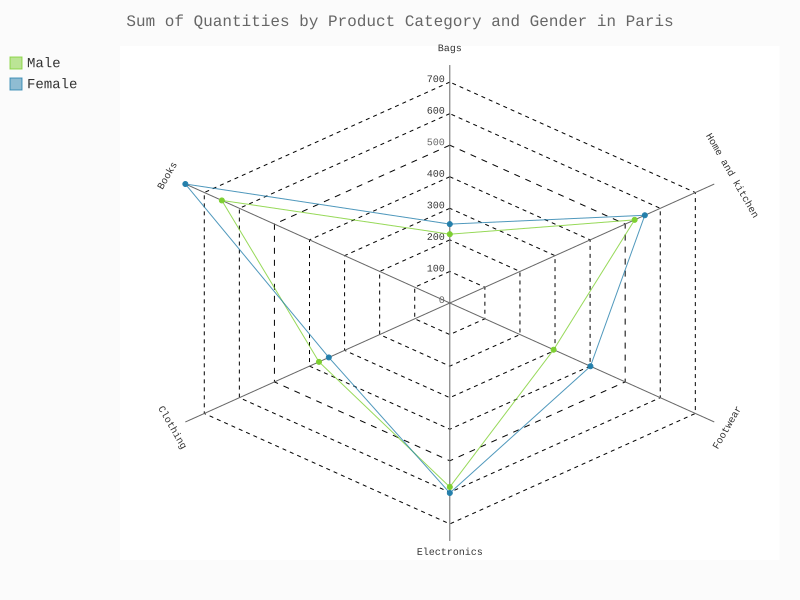

In [ ]:
import pandas as pd
import pygal
import ipywidgets as widgets
from IPython.display import SVG, display, clear_output

# Define a function to update the radar chart when the city is changed
def update_chart(city):
    # Filter the dataframe by the selected city
    filtered_df = df[df['city_code'] == city]

    # Group the dataframe by 'prod_cat' and 'gender' and calculate the sum of 'Qty'
    grouped_df = filtered_df.groupby(['prod_cat', 'Gender']).sum()

    # Reshape the dataframe to a wide format
    pivoted_df = grouped_df.pivot_table(index='prod_cat', columns='Gender', values='Qty')

    # Create a pygal radar chart
    radar_chart = pygal.Radar(show_legend=True, tooltip_border_radius=10, tooltip_font_size=15, style=pygal.style.LightGreenStyle)
    radar_chart.title = f'Sum of Quantities by Product Category and Gender in {city}'
    radar_chart.x_labels = pivoted_df.index.tolist()
    radar_chart.add('Male', pivoted_df['M'].tolist())
    radar_chart.add('Female', pivoted_df['F'].tolist())
    radar_chart.render_to_file('chart.svg')

    # Render the chart as an SVG image with tooltips
    chart_svg = radar_chart.render(disable_xml_declaration=True)
    chart_with_tooltip = add_tooltip_to_chart(chart_svg, pivoted_df)

    # Clear the output area before displaying the chart
    clear_output(wait=True)

    # Display the drop-down menu and the radar chart with tooltips
    display(city_dropdown)
    display(SVG(chart_with_tooltip))

# Create a drop-down menu with the unique city names
city_dropdown = widgets.Dropdown(
    options=df['city_code'].unique(),
    description='City:',
    value=df['city_code'].unique()[0],
    disabled=False,
)

# Define a function to handle the city change event
def on_city_change(change):
    update_chart(change.new)

# Register the city change event handler
city_dropdown.observe(on_city_change, names='value')

# Display the drop-down menu and the initial radar chart
display(city_dropdown)


In [ ]:
cities